
# Trabajo Práctico 2

Dentro de la carpeta de `data/` vamos a poder encontrar 3 datasets:

- Pokemon (Problema de clasificacion Binaria): La intención es tratar de predecir si basada en la información que tenemos podemos estimar si la carta que estamos viendo es Legendaria o no (Booleano).
- Heart Disease (Problema de clasificacion Binaria): A partir de este dataset vamos a tratar de determinar si una persona basado en ciertos datos tiene asociado una enfermedad cardiaca.
- Challenger USA Space Shuttle O-Ring Data Set (Regresion multivariada): En este dataset encontramos información sobre varios despegues del space shuttle, la intención de este problema es tratar de predecir cuanto será la cantidad de O-Rings que fallan dadas las condiciones de despegue.

> Para la presentación de sus trabajos prácticos **Elijan 1 de los 3 datasets**

# Importar librerías

Importar aquellas librerías que serán utilizadas en el trabajo.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report,f1_score, confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, recall_score
import seaborn as sns

# Cargar datos

Cargar los datos de entrenamiento.

Recordemos que para todos los datasets tenemos el archivo `columns.csv` que contiene el nombre y descripción de cada columna en el mismo orden que van a encontrar los datos.

En los casos de datos con extensión  `*.data` vamos a tener que leerlo utilizando `pd.read_data('myfile.data', sep = ',', header = 0, names = my_cols)`

De esta manera si quisieramos cargar datos por ejemplo de Nasa deberiamos poner algo asi


```python
## Importing python earlier

my_cols = pd.read_csv('./data/nasa_orings/columns.csv').column.values.tolist()

my_data = pd.read_csv('./data/nasa_orings/o-ring-erosion-or-blowby.data',
                       delimiter=',',
                       header=0,
                       names = my_cols
                    )
```

In [2]:
df = pd.read_csv('./data/pokemon/pokemon.csv')
df.head(10)

,abilities,against_bug,against_dark,against_dragon,against_electric,against_fairy,against_fight,against_fire,against_flying,against_ghost,...,percentage_male,pokedex_number,sp_attack,sp_defense,speed,type1,type2,weight_kg,generation,is_legendary
0,"['Overgrow', 'Chlorophyll']",1.00,1.0,1.0,0.5,0.5,0.5,2.0,2.0,1.0,...,88.1,1,65,65,45,grass,poison,6.9,1,0
1,"['Overgrow', 'Chlorophyll']",1.00,1.0,1.0,0.5,0.5,0.5,2.0,2.0,1.0,...,88.1,2,80,80,60,grass,poison,13.0,1,0
2,"['Overgrow', 'Chlorophyll']",1.00,1.0,1.0,0.5,0.5,0.5,2.0,2.0,1.0,...,88.1,3,122,120,80,grass,poison,100.0,1,0
3,"['Blaze', 'Solar Power']",0.50,1.0,1.0,1.0,0.5,1.0,0.5,1.0,1.0,...,88.1,4,60,50,65,fire,NaN,8.5,1,0
4,"['Blaze', 'Solar Power']",0.50,1.0,1.0,1.0,0.5,1.0,0.5,1.0,1.0,...,88.1,5,80,65,80,fire,NaN,19.0,1,0
5,"['Blaze', 'Solar Power']",0.25,1.0,1.0,2.0,0.5,0.5,0.5,1.0,1.0,...,88.1,6,159,115,100,fire,flying,90.5,1,0
6,"['Torrent', 'Rain Dish']",1.00,1.0,1.0,2.0,1.0,1.0,0.5,1.0,1.0,...,88.1,7,50,64,43,water,NaN,9.0,1,0
7,"['Torrent', 'Rain Dish']",1.00,1.0,1.0,2.0,1.0,1.0,0.5,1.0,1.0,...,88.1,8,65,80,58,water,NaN,22.5,1,0
8,"['Torrent', 'Rain Dish']",1.00,1.0,1.0,2.0,1.0,1.0,0.5,1.0,1.0,...,88.1,9,135,115,78,water,NaN,85.5,1,0
9,"['Shield Dust', 'Run Away']",1.00,1.0,1.0,1.0,1.0,0.5,2.0,2.0,1.0,...,50.0,10,20,20,45,bug,NaN,2.9,1,0


In [3]:
df_description = pd.read_csv('./data/pokemon/columns.csv')
df_description

,column,description
0,name,"""The English name of the Pokemon"""
1,japanese_name,"""The Original Japanese name of the Pokemon"""
2,pokedex_number,"""The entry number of the Pokemon in the Natio..."
3,percentage_male,"""The percentage of the species that are male...."
4,type1,"""The Primary Type of the Pokemon"""
5,type2,"""The Secondary Type of the Pokemon"""
6,classification,"""The Classification of the Pokemon as describ..."
7,height_m,"""Height of the Pokemon in metres"""
8,weight_kg,"""The Weight of the Pokemon in kilograms"""
9,capture_rate,"""Capture Rate of the Pokemon"""


# Análisis exploratorio básico y preprocesamiento de los datos

Análisis de los datos para conocer los mismos, ver datos faltantes, decidir cómo tratarlos, ver distribuciones, relaciones, etc. Procesar los datos centrándolos, reescalando, codificando, reduciendo dimensiones, etc. según considere necesario.

Vamos a considerar:

- Para escalar datos: `sklearn.preprocessing.StandardScaler()`
- Para completar valores nulos: `sklearn.impute.SimpleImputer()` [Quickguide](https://scikit-learn.org/stable/modules/impute.html)
- Para reduccion de dimensiones (sobre todo para visualizar los datos): PCA o [T-SNE](https://builtin.com/data-science/tsne-python) (Solo para visualización)
- Para codificar variables categóricas: `sklearn.preprocessing.OneHotEncoder()`

In [4]:
#info from dataset
print(f"Cantidad de filas y columnas: {df.shape}")
print(f"Nombre de columnas: {df.columns}")

Cantidad de filas y columnas: (801, 41)
Nombre de columnas: Index(['abilities', 'against_bug', 'against_dark', 'against_dragon',
       'against_electric', 'against_fairy', 'against_fight', 'against_fire',
       'against_flying', 'against_ghost', 'against_grass', 'against_ground',
       'against_ice', 'against_normal', 'against_poison', 'against_psychic',
       'against_rock', 'against_steel', 'against_water', 'attack',
       'base_egg_steps', 'base_happiness', 'base_total', 'capture_rate',
       'classfication', 'defense', 'experience_growth', 'height_m', 'hp',
       'japanese_name', 'name', 'percentage_male', 'pokedex_number',
       'sp_attack', 'sp_defense', 'speed', 'type1', 'type2', 'weight_kg',
       'generation', 'is_legendary'],
      dtype='object')


In [5]:
#Data type from each columns and non null values
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 801 entries, 0 to 800
Data columns (total 41 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   abilities          801 non-null    object 
 1   against_bug        801 non-null    float64
 2   against_dark       801 non-null    float64
 3   against_dragon     801 non-null    float64
 4   against_electric   801 non-null    float64
 5   against_fairy      801 non-null    float64
 6   against_fight      801 non-null    float64
 7   against_fire       801 non-null    float64
 8   against_flying     801 non-null    float64
 9   against_ghost      801 non-null    float64
 10  against_grass      801 non-null    float64
 11  against_ground     801 non-null    float64
 12  against_ice        801 non-null    float64
 13  against_normal     801 non-null    float64
 14  against_poison     801 non-null    float64
 15  against_psychic    801 non-null    float64
 16  against_rock       801 non

In [6]:
#confirming null values from each columns
df.isnull().sum()

abilities              0
against_bug            0
against_dark           0
against_dragon         0
against_electric       0
against_fairy          0
against_fight          0
against_fire           0
against_flying         0
against_ghost          0
against_grass          0
against_ground         0
against_ice            0
against_normal         0
against_poison         0
against_psychic        0
against_rock           0
against_steel          0
against_water          0
attack                 0
base_egg_steps         0
base_happiness         0
base_total             0
capture_rate           0
classfication          0
defense                0
experience_growth      0
height_m              20
hp                     0
japanese_name          0
name                   0
percentage_male       98
pokedex_number         0
sp_attack              0
sp_defense             0
speed                  0
type1                  0
type2                384
weight_kg             20
generation             0


In [7]:
#stadistic analisys
df.describe()

,against_bug,against_dark,against_dragon,against_electric,against_fairy,against_fight,against_fire,against_flying,against_ghost,against_grass,...,height_m,hp,percentage_male,pokedex_number,sp_attack,sp_defense,speed,weight_kg,generation,is_legendary
count,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,801.000000,...,781.000000,801.000000,703.000000,801.000000,801.000000,801.000000,801.000000,781.000000,801.000000,801.000000
mean,0.996255,1.057116,0.968789,1.073970,1.068976,1.065543,1.135456,1.192884,0.985019,1.034020,...,1.163892,68.958801,55.155761,401.000000,71.305868,70.911361,66.334582,61.378105,3.690387,0.087391
std,0.597248,0.438142,0.353058,0.654962,0.522167,0.717251,0.691853,0.604488,0.558256,0.788896,...,1.080326,26.576015,20.261623,231.373075,32.353826,27.942501,28.907662,109.354766,1.930420,0.282583
min,0.250000,0.250000,0.000000,0.000000,0.250000,0.000000,0.250000,0.250000,0.000000,0.250000,...,0.100000,1.000000,0.000000,1.000000,10.000000,20.000000,5.000000,0.100000,1.000000,0.000000
25%,0.500000,1.000000,1.000000,0.500000,1.000000,0.500000,0.500000,1.000000,1.000000,0.500000,...,0.600000,50.000000,50.000000,201.000000,45.000000,50.000000,45.000000,9.000000,2.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,65.000000,50.000000,401.000000,65.000000,66.000000,65.000000,27.300000,4.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,...,1.500000,80.000000,50.000000,601.000000,91.000000,90.000000,85.000000,64.800000,5.000000,0.000000
max,4.000000,4.000000,2.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,...,14.500000,255.000000,100.000000,801.000000,194.000000,230.000000,180.000000,999.900000,7.000000,1.000000


In [8]:
#Distribution for this dataset
sns.pairplot(df)

Es muy dificil ver la distribuciones con la actual cantidad de features o dimensiones que tiene el dataset. Por este motivo más adelante se graficaran los features que considero más importante

/var/folders/th/f02nw4xd4xg6c6tc6mn55h800000gn/T/ipykernel_1184/2095625916.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = df.corr(method='pearson')


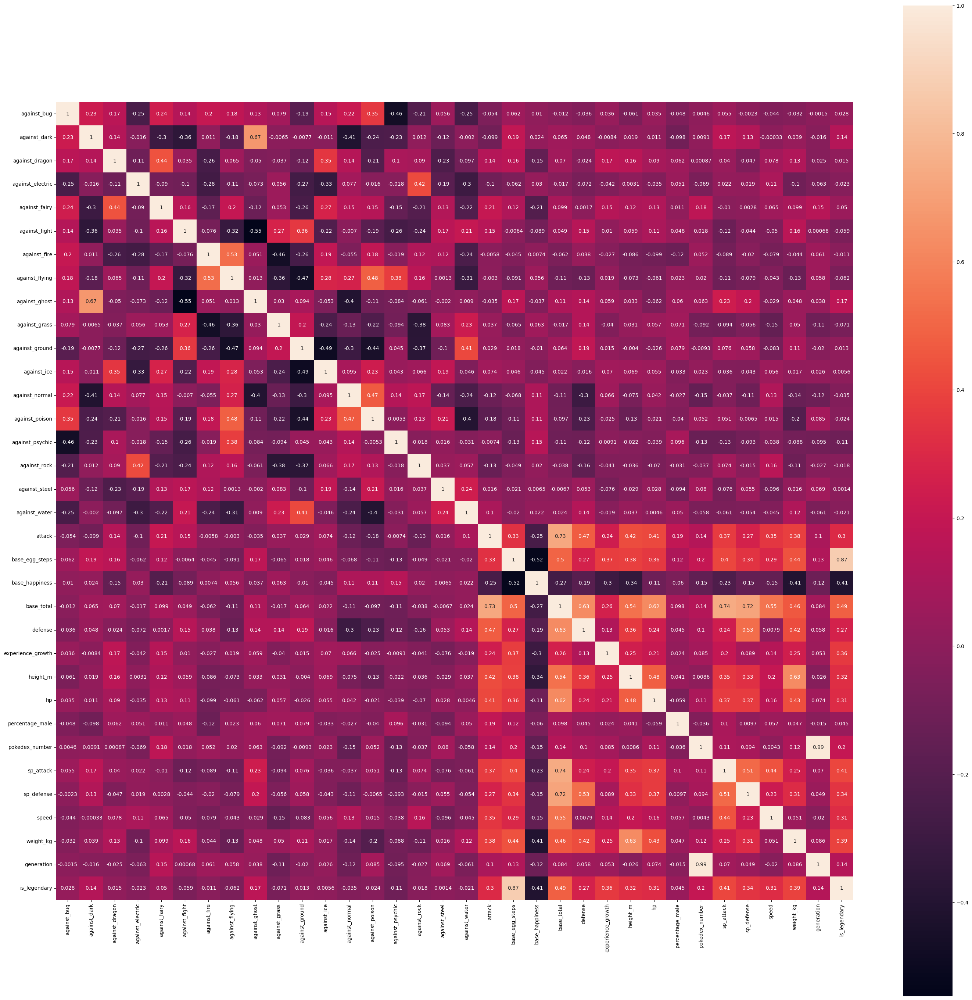

In [9]:
#Correlation between variables
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(35, 35))

corr = df.corr(method='pearson')
sns.heatmap(
    corr,
    square    = True,
    ax        = ax,
    annot=True
)

ax.tick_params(labelsize = 10)

El cuadro de correlacion por ahora es muy extenso y es dificil notar los features que tienen una relacion lineal con 'is_legendary', la variable que intentamos predecir. Sin embargo, podemos notar algunas que se nombraran más abajo en el analisis.

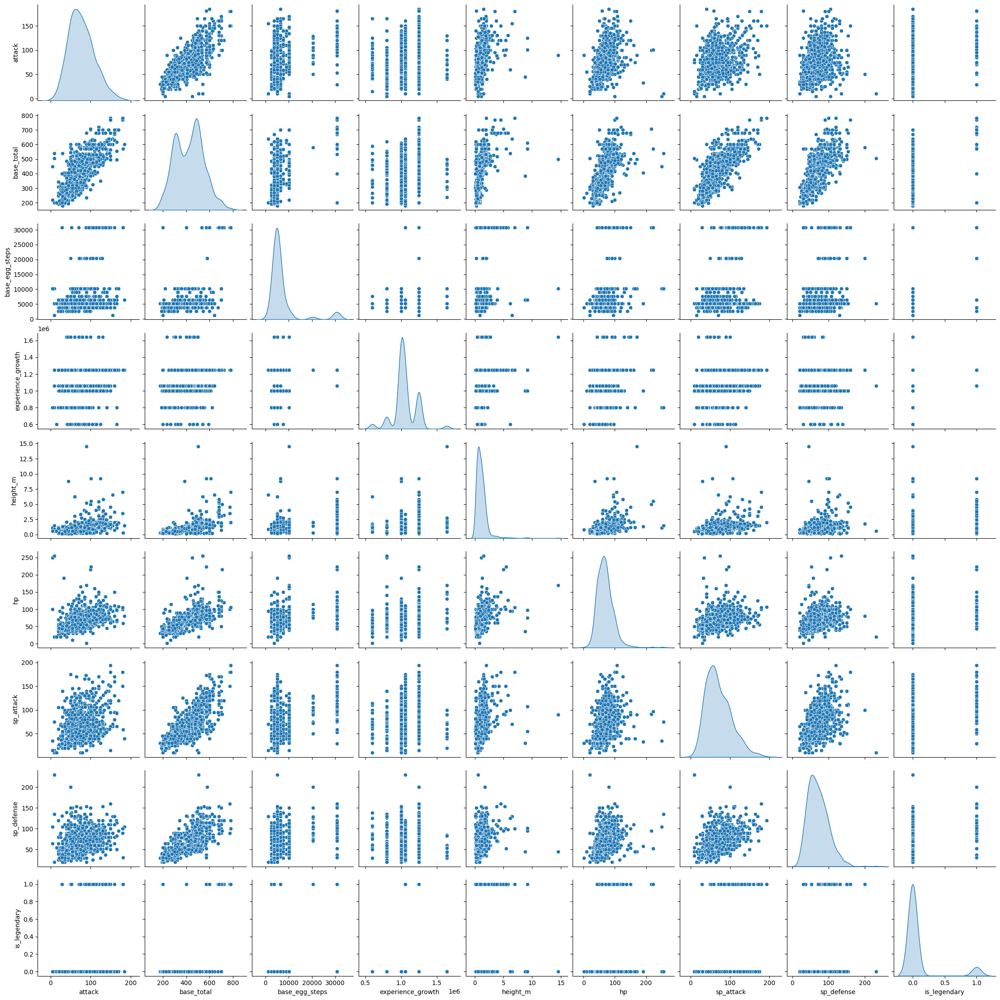

In [10]:
#Some of the important features I noticed
sns.pairplot(df[['attack', 'base_total', 'base_egg_steps', 'experience_growth', 'height_m', 'hp', 'sp_attack', 'sp_defense', 'is_legendary']], diag_kind="kde")

### analisis
1. ¿tenemos campos con valores nulos?
* si, tenemos varias columnas con datos nulos, las cuales son:
    * 27 - height_m       -   781 non-null (20 null values) -   float64
    * 31 - percentage_male-   703 non-null (98 null values)  -   float64
    * 37 - type2          -    417 non-null (384 null values)-   object
    * 38 - weight_kg      -    781 non-null (20 null values) -   float64
2. ¿Como se van a tratar los datos nulos?
* Por cada variable se aplicara una tecnica distinta para lidear con los valores nulos:
    * height_m se utilizara la media para representar los valores nulos ya que son poco los valores faltantes.
    * percentage_male se utilizara el valor más frecuente en donde esten los valores nulos.
    * type2 al ser una variable categorica se usara la estrategia de reemplazar los valores nulos con los más frecuentes.
    * weight_kg tambien se utilizara la media ya que son poco los valores faltantes.
3. ¿Como se relacionan?
* Como se puede observar en el cuadro de correlación según el coeficiente de Pearson, las variables que están más relacionadas a la variable que intentamos predecir (is_legendary) son:
    * attack
    * base_egg_steps
    * base_total
    * experience_growth
    * height_m
    * hp
    * sp_attack
    * sp_defence
    * speed
    * weight_kg
4. ¿Cual distribucion siguen los datos?
* Por el histograma armado anteriormente, este conjunto de datos parece seguir distintas distribuciones entre las cuales se encuentran:
    * uniforme
    * Bernoulli (is_legendary la veriable que buscamos predecir sigue esta distribucion)
    * Normal
    * otros



### Preprocesamiento

Como primer paso se hace la division de la data que va destinada al training, validation y test.

In [11]:
# Funcion de split creada en el ejercicio 5
def split(df: pd.DataFrame, train_percentage: float, test_percentage: float):
    
    #defining X
    X = df.drop(columns='is_legendary') #removing target column
    x_layer = X.columns #taking all features
    #defining y
    y_layer = df['is_legendary'] #target column

    np.random.seed(0)
    df_length = len(df)
    train_size = int(df_length * train_percentage)

    #Permuting rows in the dataset to avoid any kind of pattern
    permute_index = np.random.permutation(df_length)
    #get train data using slicing
    train_df = permute_index[0:train_size]
    
    #get validation data using slicing
    valid_df = permute_index[train_size:int(df_length - test_percentage * df_length)]
    
    #get test data
    test_df = permute_index[int(df_length - test_percentage * df_length):df_length]
    
    
    #X train-validation-test
    X_train = X.iloc[train_df][x_layer]
    X_val = X.iloc[valid_df][x_layer]
    X_test = X.iloc[test_df][x_layer]

    #Y train-validation-test
    Y_train = y_layer.iloc[train_df]
    Y_val = y_layer.iloc[valid_df]
    Y_test =y_layer.iloc[test_df]

    return  X_train, X_val, X_test, Y_train, Y_val, Y_test

In [12]:
#splitting values
train_percentage = 0.7
test_percentage = 0.1
X_train, X_val, X_test, Y_train, Y_val, Y_test = split(df, train_percentage, test_percentage)

In [13]:
#Checking if we have missing values in the training set
X_train.isnull().sum()

abilities              0
against_bug            0
against_dark           0
against_dragon         0
against_electric       0
against_fairy          0
against_fight          0
against_fire           0
against_flying         0
against_ghost          0
against_grass          0
against_ground         0
against_ice            0
against_normal         0
against_poison         0
against_psychic        0
against_rock           0
against_steel          0
against_water          0
attack                 0
base_egg_steps         0
base_happiness         0
base_total             0
capture_rate           0
classfication          0
defense                0
experience_growth      0
height_m              13
hp                     0
japanese_name          0
name                   0
percentage_male       66
pokedex_number         0
sp_attack              0
sp_defense             0
speed                  0
type1                  0
type2                273
weight_kg             13
generation             0


Missing values for X_train:
* height_m              13
* percentage_male       66
* type2                273
* weight_kg             13

In [14]:
#filling missing values with the mean
filling_value01 = SimpleImputer(strategy='mean',missing_values=np.nan)
X_train[['height_m']]= filling_value01.fit_transform(X_train[['height_m']])
X_train[['weight_kg']] = filling_value01.fit_transform(X_train[['weight_kg']])
X_train[['height_m', 'weight_kg']].isnull().sum()

height_m     0
weight_kg    0
dtype: int64

In [15]:
#filling missing values with most frequent value
filling_value03 = SimpleImputer(strategy='most_frequent',missing_values=np.nan)
X_train[['type2']] = filling_value03.fit_transform(X_train[['type2']])
X_train[['percentage_male']] = filling_value03.fit_transform(X_train[['percentage_male']])
X_train[['type2', 'percentage_male']].isnull().sum()


type2              0
percentage_male    0
dtype: int64

In [16]:
X_train.isnull().sum().sum()

0

In [17]:
#checking missing values for X_test
X_test.isnull().sum()

abilities             0
against_bug           0
against_dark          0
against_dragon        0
against_electric      0
against_fairy         0
against_fight         0
against_fire          0
against_flying        0
against_ghost         0
against_grass         0
against_ground        0
against_ice           0
against_normal        0
against_poison        0
against_psychic       0
against_rock          0
against_steel         0
against_water         0
attack                0
base_egg_steps        0
base_happiness        0
base_total            0
capture_rate          0
classfication         0
defense               0
experience_growth     0
height_m              1
hp                    0
japanese_name         0
name                  0
percentage_male      12
pokedex_number        0
sp_attack             0
sp_defense            0
speed                 0
type1                 0
type2                38
weight_kg             1
generation            0
dtype: int64

Missing values X_test:
* percentage_male      12
* type2                38
* weight_kg             1
* height_m              1

In [18]:
#filling missing values with most frequent value
X_test[['type2']] = filling_value03.fit_transform(X_test[['type2']])
X_test[['percentage_male']]= filling_value03.fit_transform(X_test[['percentage_male']])

#filling missing values with the mean
X_test[['weight_kg']] = filling_value01.fit_transform(X_test[['weight_kg']])
X_test[['height_m']] = filling_value01.fit_transform(X_test[['height_m']])
X_test[['weight_kg', 'percentage_male', 'type2', 'height_m' ]].isnull().sum()

weight_kg          0
percentage_male    0
type2              0
height_m           0
dtype: int64

In [19]:
X_test.isnull().sum().sum()

0

Ahora el set de entrenamiento y test se encuentran sin datos nulos

In [20]:
#Extracting categorical values
cat = X_train.select_dtypes(include='O')
cat

,abilities,capture_rate,classfication,japanese_name,name,type1,type2
8,"['Torrent', 'Rain Dish']",45,Shellfish Pokémon,Kamexカメックス,Blastoise,water,flying
253,"['Overgrow', 'Unburden']",45,Forest Pokémon,Jukainジュカイン,Sceptile,grass,flying
85,"['Thick Fat', 'Hydration', 'Ice Body']",190,Sea Lion Pokémon,Pawouパウワウ,Seel,water,flying
406,"['Natural Cure', 'Poison Point', 'Technician']",75,Bouquet Pokémon,Roseradeロズレイド,Roserade,grass,poison
14,"['Swarm', 'Sniper']",45,Poison Bee Pokémon,Spearスピアー,Beedrill,bug,poison
...,...,...,...,...,...,...,...
744,"['Keen Eye', 'Sand Rush', 'Steadfast', 'Keen E...",90,Wolf Pokémon,Lugarugan (mahiru No Sugata)ルガルガン,Lycanroc,rock,flying
146,"['Shed Skin', 'Marvel Scale']",45,Dragon Pokémon,Miniryuミニリュウ,Dratini,dragon,flying
289,"['Compoundeyes', 'Run Away']",255,Trainee Pokémon,Tutininツチニン,Nincada,bug,ground
29,"['Poison Point', 'Rivalry', 'Hustle']",120,Poison Pin Pokémon,Nidorinaニドリーナ,Nidorina,poison,flying


In [21]:
#taking care of categorical data with OneHotEncoder
encoder = OneHotEncoder(handle_unknown='ignore') #handle_unknown to ignor categories Which are not present in the Training set but are present in the test set
X_encoded = encoder.fit_transform(cat) #encoder.fit_transform will give an array.
X_train_encoded = pd.DataFrame(X_encoded)
X_train_encoded.head()

,0
0,"(0, 363)\t1.0\n (0, 405)\t1.0\n (0, 756)\t..."
1,"(0, 201)\t1.0\n (0, 405)\t1.0\n (0, 563)\t..."
2,"(0, 354)\t1.0\n (0, 395)\t1.0\n (0, 744)\t..."
3,"(0, 183)\t1.0\n (0, 411)\t1.0\n (0, 456)\t..."
4,"(0, 326)\t1.0\n (0, 405)\t1.0\n (0, 700)\t..."


In [22]:
#encoding test data
X_test_encoded = encoder.fit_transform(X_test)
X_test_encoded.shape

(81, 941)

Ahora normalizamos los datos numericos

In [23]:
#maximum likelihood estimate X_train
X_train.var(ddof=0)

/var/folders/th/f02nw4xd4xg6c6tc6mn55h800000gn/T/ipykernel_1184/3168625506.py:2: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  X_train.var(ddof=0)


against_bug          3.565830e-01
against_dark         1.846379e-01
against_dragon       1.110770e-01
against_electric     4.111446e-01
against_fairy        2.570773e-01
against_fight        5.099839e-01
against_fire         5.004367e-01
against_flying       3.696411e-01
against_ghost        3.060459e-01
against_grass        6.441518e-01
against_ground       5.392849e-01
against_ice          5.263712e-01
against_normal       6.664541e-02
against_poison       2.707581e-01
against_psychic      2.446490e-01
against_rock         5.181051e-01
against_steel        2.550861e-01
against_water        3.487596e-01
attack               1.000820e+03
base_egg_steps       4.613554e+07
base_happiness       4.310711e+02
base_total           1.385099e+04
defense              8.603069e+02
experience_growth    2.646286e+10
height_m             9.809780e-01
hp                   7.375824e+02
percentage_male      3.946344e+02
pokedex_number       5.270071e+04
sp_attack            1.035481e+03
sp_defense    

In [24]:
#Extracting numerical values
num_cols = X_train.select_dtypes(include='number')
num_cols

,against_bug,against_dark,against_dragon,against_electric,against_fairy,against_fight,against_fire,against_flying,against_ghost,against_grass,...,experience_growth,height_m,hp,percentage_male,pokedex_number,sp_attack,sp_defense,speed,weight_kg,generation
8,1.0,1.0,1.0,2.0,1.0,1.00,0.5,1.0,1.0,2.00,...,1059860,1.600000,79,88.1,9,135,115,78,85.500000,1
253,2.0,1.0,1.0,0.5,1.0,1.00,2.0,2.0,1.0,0.50,...,1059860,1.700000,70,88.1,254,145,85,145,52.200000,3
85,1.0,1.0,1.0,2.0,1.0,1.00,0.5,1.0,1.0,2.00,...,1000000,1.100000,65,50.0,86,45,70,45,90.000000,1
406,1.0,1.0,1.0,0.5,0.5,0.50,2.0,2.0,1.0,0.25,...,1059860,0.900000,60,50.0,407,125,105,90,14.500000,4
14,0.5,1.0,1.0,1.0,0.5,0.25,2.0,2.0,1.0,0.25,...,1000000,1.000000,65,50.0,15,15,80,145,29.500000,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,1.0,1.0,1.0,1.0,1.0,2.00,0.5,0.5,1.0,2.00,...,1000000,1.132907,85,50.0,745,55,75,82,61.096527,7
146,1.0,1.0,2.0,0.5,2.0,1.00,0.5,1.0,1.0,0.50,...,1250000,1.800000,41,50.0,147,50,50,50,3.300000,1
289,1.0,1.0,1.0,0.0,1.0,0.50,2.0,2.0,1.0,1.00,...,600000,0.500000,31,50.0,290,30,30,40,5.500000,3
29,0.5,1.0,1.0,1.0,0.5,0.50,1.0,1.0,1.0,0.50,...,1059860,0.800000,70,0.0,30,55,55,56,20.000000,1


In [25]:
#scaling numerical values
standarizer = StandardScaler()
X_train_scaled = standarizer.fit_transform(num_cols) #Only normalize numeric data
X_train_to_show = pd.DataFrame(X_train_scaled, columns=num_cols.columns)#adding back the columns and rebuilding the dataframe
X_train_to_show.head()

,against_bug,against_dark,against_dragon,against_electric,against_fairy,against_fight,against_fire,against_flying,against_ghost,against_grass,...,experience_growth,height_m,hp,percentage_male,pokedex_number,sp_attack,sp_defense,speed,weight_kg,generation
0,0.002243,-0.136101,0.093764,1.426582,-0.117104,-0.090645,-0.887915,-0.320880,0.025823,1.183667,...,0.043605,0.471600,0.355585,1.657386,-1.725318,1.946596,1.637132,0.349787,0.220409,-1.425258
1,1.676876,-0.136101,0.093764,-0.912762,-0.117104,-0.090645,1.232479,1.323907,0.025823,-0.685281,...,0.043605,0.572565,0.024197,1.657386,-0.658089,2.257359,0.522579,2.659130,-0.080352,-0.381932
2,0.002243,-0.136101,0.093764,1.426582,-0.117104,-0.090645,-0.887915,-0.320880,0.025823,1.183667,...,-0.324370,-0.033224,-0.159908,-0.260521,-1.389903,-0.850269,-0.034697,-0.787651,0.261052,-1.425258
3,0.002243,-0.136101,0.093764,-0.912762,-1.103243,-0.790796,1.232479,1.323907,0.025823,-0.996772,...,0.043605,-0.235154,-0.344013,-0.260521,0.008385,1.635833,1.265615,0.763400,-0.420854,0.139731
4,-0.835074,-0.136101,0.093764,-0.132981,-1.103243,-1.140871,1.232479,1.323907,0.025823,-0.996772,...,-0.324370,-0.134189,-0.159908,-0.260521,-1.699182,-1.782558,0.336821,2.659130,-0.285376,-1.425258


In [26]:
#Rebuilding X_train with OneHotEncoding done and numerical values normalized
X_train_completed = pd.concat([X_train_encoded, X_train_to_show],axis=1)
X_train_completed.head()

,0,against_bug,against_dark,against_dragon,against_electric,against_fairy,against_fight,against_fire,against_flying,against_ghost,...,experience_growth,height_m,hp,percentage_male,pokedex_number,sp_attack,sp_defense,speed,weight_kg,generation
0,"(0, 363)\t1.0\n (0, 405)\t1.0\n (0, 756)\t...",0.002243,-0.136101,0.093764,1.426582,-0.117104,-0.090645,-0.887915,-0.320880,0.025823,...,0.043605,0.471600,0.355585,1.657386,-1.725318,1.946596,1.637132,0.349787,0.220409,-1.425258
1,"(0, 201)\t1.0\n (0, 405)\t1.0\n (0, 563)\t...",1.676876,-0.136101,0.093764,-0.912762,-0.117104,-0.090645,1.232479,1.323907,0.025823,...,0.043605,0.572565,0.024197,1.657386,-0.658089,2.257359,0.522579,2.659130,-0.080352,-0.381932
2,"(0, 354)\t1.0\n (0, 395)\t1.0\n (0, 744)\t...",0.002243,-0.136101,0.093764,1.426582,-0.117104,-0.090645,-0.887915,-0.320880,0.025823,...,-0.324370,-0.033224,-0.159908,-0.260521,-1.389903,-0.850269,-0.034697,-0.787651,0.261052,-1.425258
3,"(0, 183)\t1.0\n (0, 411)\t1.0\n (0, 456)\t...",0.002243,-0.136101,0.093764,-0.912762,-1.103243,-0.790796,1.232479,1.323907,0.025823,...,0.043605,-0.235154,-0.344013,-0.260521,0.008385,1.635833,1.265615,0.763400,-0.420854,0.139731
4,"(0, 326)\t1.0\n (0, 405)\t1.0\n (0, 700)\t...",-0.835074,-0.136101,0.093764,-0.132981,-1.103243,-1.140871,1.232479,1.323907,0.025823,...,-0.324370,-0.134189,-0.159908,-0.260521,-1.699182,-1.782558,0.336821,2.659130,-0.285376,-1.425258


In [27]:
#maximum likelihood estimate X_train again after normalizing
X_train_completed.var(ddof=0)

/var/folders/th/f02nw4xd4xg6c6tc6mn55h800000gn/T/ipykernel_1184/2049058078.py:2: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  X_train_completed.var(ddof=0)


against_bug          1.0
against_dark         1.0
against_dragon       1.0
against_electric     1.0
against_fairy        1.0
against_fight        1.0
against_fire         1.0
against_flying       1.0
against_ghost        1.0
against_grass        1.0
against_ground       1.0
against_ice          1.0
against_normal       1.0
against_poison       1.0
against_psychic      1.0
against_rock         1.0
against_steel        1.0
against_water        1.0
attack               1.0
base_egg_steps       1.0
base_happiness       1.0
base_total           1.0
defense              1.0
experience_growth    1.0
height_m             1.0
hp                   1.0
percentage_male      1.0
pokedex_number       1.0
sp_attack            1.0
sp_defense           1.0
speed                1.0
weight_kg            1.0
generation           1.0
dtype: float64

In [28]:
#Extract num
num_cols02 = X_test.select_dtypes(include='number')

In [29]:
#Standirize X_test
X_test_scaled = standarizer.fit_transform(num_cols02)

Con el objetivo de visualizar como cada features se estandarizaba se utilizo el X_train_to_show y se armo de vuelta el dataset original con los headers originales de cada columna. Sin embargo, para aplicar PCA va a servir tener la data tal cual como sale del X_train_scaled (Sin headers en las columnas, solo tendra numeros) y armar el nuevo dataset con eso más lo que tenemos de la codificacion del OneHotEncoder.

In [30]:
#taking back just number Dataframe
#X_train_scaled = pd.DataFrame(X_train_scaled)
X_train_final = np.concatenate([X_encoded.toarray(), X_train_scaled],axis=1)


Ahora se puede usar PCA para reducir los datos.

In [31]:
X_train_final.shape

(560, 2043)

In [32]:
pca_test = PCA(n_components=21)
X_train_reduced = pca_test.fit_transform(X_train_final)
X_train_reduced.shape

(560, 21)

In [33]:
variance_exp = pca_test.explained_variance_ratio_
print(variance_exp[:5])
print("variabilidad explicada con 20 componentes: {:.2f}".format(sum(variance_exp[0:20])))

[0.13658475 0.09116298 0.0667636  0.05836078 0.05369942]
variabilidad explicada con 20 componentes: 0.80


Como se puede observar con 21 componentes podemos tener una variabilidad explicada cerca del 80%. Ahora con esto podemos graficar aquellas caracteristicas que representar mejor al sistema.

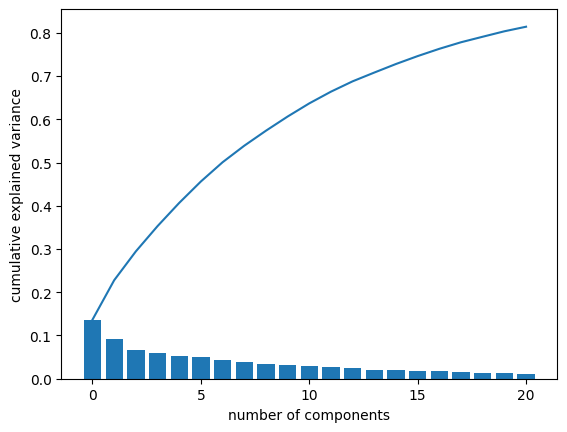

In [34]:
plt.plot(np.cumsum(pca_test.explained_variance_ratio_))
plt.bar(range(0,len(pca_test.explained_variance_ratio_)), pca_test.explained_variance_ratio_)
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

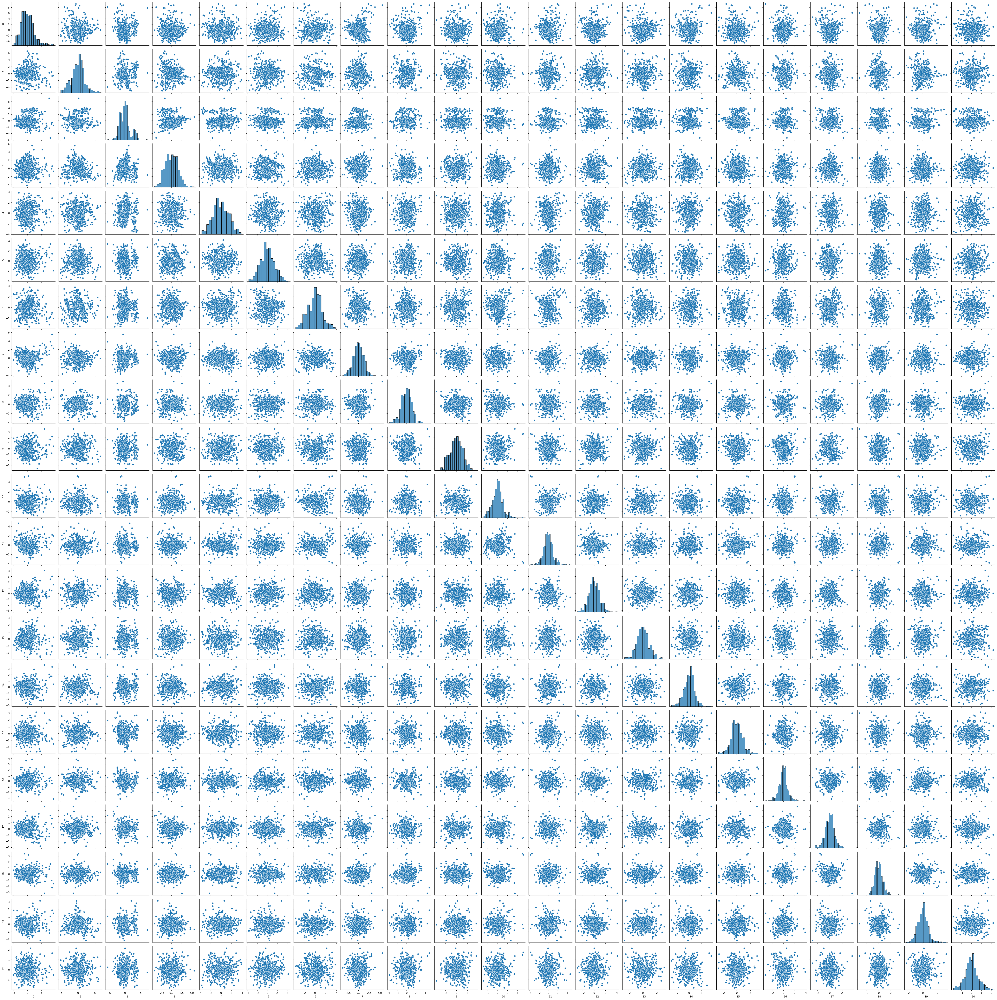

In [35]:
#Correlation between variables
visual_data = pd.DataFrame(X_train_reduced)

sns.pairplot(visual_data)

In [36]:
X_test_final = np.concatenate([X_test_encoded.toarray(), X_test_scaled],axis=1)

pca_test2 = PCA(n_components=21)
X_test_reduced = pca_test2.fit_transform(X_test_final)
X_test_reduced.shape

(81, 21)

In [37]:
variance_exp02 = pca_test2.explained_variance_ratio_
print(variance_exp02[:5])
print("variabilidad explicada con 20 componentes: {:.2f}".format(sum(variance_exp02[0:20])))

[0.11950962 0.0831043  0.0726838  0.0553476  0.0517386 ]
variabilidad explicada con 20 componentes: 0.74


# Modelos y evaluación
Probar diferentes modelos para predecir la variable objetivo. Calcular las métricas que considere relevantes. Comentar los resultados. 

In [38]:
from sklearn.linear_model import ElasticNet, ElasticNetCV, LogisticRegression, LogisticRegressionCV, SGDClassifier, SGDRegressor

Inicializamos nuestros modelos de aprendizaje

In [39]:
#regresión LogisticRegression
lr = LogisticRegression(random_state=0)
lr.fit(X_train_reduced, Y_train)
y_pred_lr = lr.predict(X_test_reduced)

In [40]:
#regresión LogisticRegressionCV
lrcv = LogisticRegressionCV(cv=3, random_state=0, max_iter=200)
lrcv.fit(X_train_reduced, Y_train)
y_pred_lrcv = lrcv.predict(X_test_reduced)

In [41]:
# clasificación SGDClassifier
sgdc = SGDClassifier(random_state=0)
sgdc.fit(X_train_reduced, Y_train)
y_pred_sgdc = sgdc.predict(X_test_reduced)

Ahora usaremos las siguientes metricas para medir el rendimiento de nuestros modelos.

In [42]:
# For binary classification only (metrics valid)
#Accuracy
accuracy_lr = accuracy_score(Y_test, y_pred_lr)
accuracy_lrcv = accuracy_score(Y_test, y_pred_lrcv)
accuracy_sgdc = accuracy_score(Y_test, y_pred_sgdc)
#Precision
precision_lr = precision_score(Y_test, y_pred_lr)
precision_lrcv = precision_score(Y_test, y_pred_lrcv)
precision_sgdc = precision_score(Y_test, y_pred_sgdc)
#Recall
recall_lr = recall_score(Y_test, y_pred_lr)
recall_lrcv = recall_score(Y_test, y_pred_lrcv)
recall_sgdc = recall_score(Y_test, y_pred_sgdc)
#F1
f1_lr = f1_score(Y_test, y_pred_lr)
f1_lrcv = f1_score(Y_test, y_pred_lrcv)
f1_sgdc = f1_score(Y_test, y_pred_sgdc)


In [43]:
print("#######")
print("Logistic Regression")
print(f"Accuracy: {accuracy_lr}")
print(f"Precision: {precision_lr}")
print(f"Recall: {recall_lr}")
print(f"F1: {f1_lr}")
print("#######")
print("Logistic Regression Cross Validation")
print(f"Accuracy: {accuracy_lrcv}")
print(f"Precision: {precision_lrcv}")
print(f"Recall: {recall_lrcv}")
print(f"F1: {f1_lrcv}")
print("#######")
print("SGDClassifier")
print(f"Accuracy: {accuracy_sgdc}")
print(f"Precision: {precision_sgdc}")
print(f"Recall: {recall_sgdc}")
print(f"F1: {f1_sgdc}")

#######
Logistic Regression
Accuracy: 0.9135802469135802
Precision: 0.2857142857142857
Recall: 0.5
F1: 0.36363636363636365
#######
Logistic Regression Cross Validation
Accuracy: 0.9259259259259259
Precision: 0.375
Recall: 0.75
F1: 0.5
#######
SGDClassifier
Accuracy: 0.9135802469135802
Precision: 0.2857142857142857
Recall: 0.5
F1: 0.36363636363636365


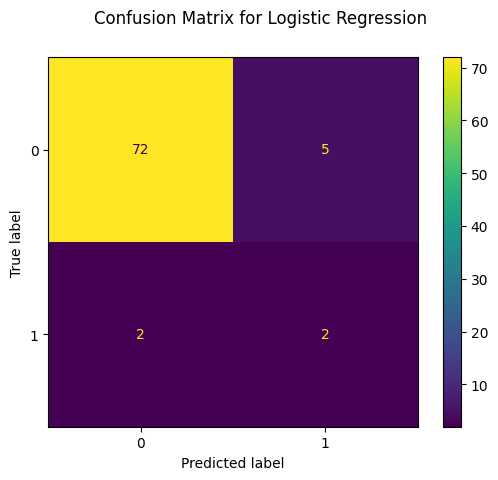

In [44]:
#Logistic Regression
disp = ConfusionMatrixDisplay.from_predictions(Y_test,y_pred_lr)
disp.figure_.suptitle("Confusion Matrix for Logistic Regression")
plt.show()

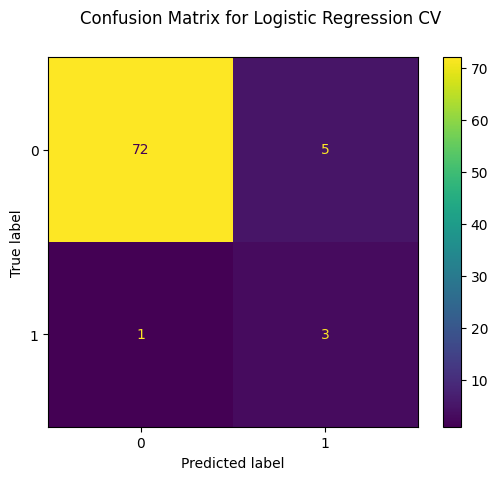

In [45]:
#Logistic Regression Cross Validation
disp2 = ConfusionMatrixDisplay.from_predictions(Y_test,y_pred_lrcv)
disp2.figure_.suptitle("Confusion Matrix for Logistic Regression CV")
plt.show()

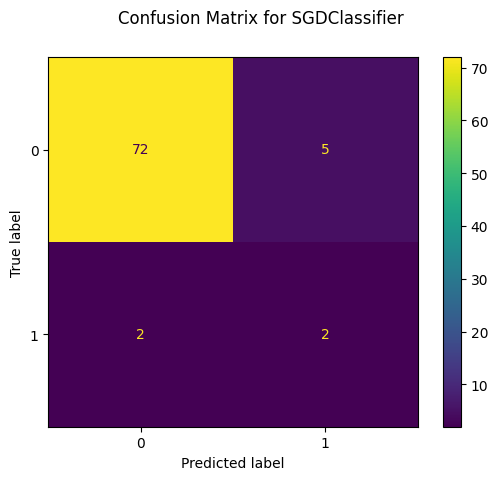

In [46]:
# SGDClassifier
disp3 = ConfusionMatrixDisplay.from_predictions(Y_test,y_pred_sgdc)
disp3.figure_.suptitle("Confusion Matrix for SGDClassifier")
plt.show()

In [47]:
#Report for confirm results
print("Logistic Regression")
print(classification_report(Y_test, y_pred_lr))
print("Logistic Regression Cross Validation")
print(classification_report(Y_test, y_pred_lrcv))
print("SGDClassifier")
print(classification_report(Y_test, y_pred_sgdc))

Logistic Regression
              precision    recall  f1-score   support

           0       0.97      0.94      0.95        77
           1       0.29      0.50      0.36         4

    accuracy                           0.91        81
   macro avg       0.63      0.72      0.66        81
weighted avg       0.94      0.91      0.92        81

Logistic Regression Cross Validation
              precision    recall  f1-score   support

           0       0.99      0.94      0.96        77
           1       0.38      0.75      0.50         4

    accuracy                           0.93        81
   macro avg       0.68      0.84      0.73        81
weighted avg       0.96      0.93      0.94        81

SGDClassifier
              precision    recall  f1-score   support

           0       0.97      0.94      0.95        77
           1       0.29      0.50      0.36         4

    accuracy                           0.91        81
   macro avg       0.63      0.72      0.66        81
wei

### Analisis
Las metricas que se usaron para medir el rendimiento de los tres clasificadores fueron:
* Accuracy
* Precision
* Recall
* F1

De las cuales se obtuvo lo siguiente:

La precision para la clase 0 estuvo bastante elevada en los tres modelos, es decir, en general los tres modelos pudieron predecir o clasificar bien cuando el pokemon no era legendario. Esto tambien se puede notar en las matrices de confusion, donde se muestra que en las instancias donde el valor real era 0 el valor predicho tambien fue 0 en un 70%. Sin embargo, para la clase 1 referente a indentificar al pokemon como legendario, estuvo bastante deficiente, donde la precision estuvo al rededor 0,29 para los clasificadores Logistic Regression y SGDClassifier respectivamente. Por otro lado, este valor tiene una mejora para Logistic Regression CV donde obtuvo una precision de 0,38.

Este mal desempeño en la prediccion de la clase 1 (es legendario) se puede deber a muchos factores, entre ellos se tiene a que en los datos originales se tuvo muy pocos casos donde la clase 1 aparecia en comparación con la clase 0, tambien se puede deber a un mal procesamiento de datos.

En general el Logistic Regression CV tuvo el mejor desempeño en las metricas de F1, recall y precision en comparación con los otros modelos probados. Esto se puede deber a muchos factores, pero en este caso se debe al uso de la validación cruzada, cuando variamos este parametro se nota que afecta directamente la precision del clasificar al punto donde si lo variamos de 3 a 5 nos da la misma precision que los otros dos clasificadores.